In [1]:
import MTM.micelles as micelle
import numpy as np
from mkutils import create_fig, save_to_file
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [2]:
mic = micelle.RodlikeMicelle(130, 298, 10, throw_errors=False)

n = 250
rs = np.linspace(0.01, mic.length, n)
rc = np.linspace(0.01, mic.length, n)

mu = np.zeros((n, n))
rs_mesh, rc_mesh = np.meshgrid(rs, rc, indexing='xy')
# indexing convention is sus af.

for i in range(n):
    for ii in range(n):
        mic._r_sph = rs_mesh[ii, i]
        mic._r_cyl = rc_mesh[ii, i]
        try:
            mui = mic.get_delta_chempot()
            if np.isnan(mui):
                mui = 100
        except:
            mui = 100
        if mic.surfactants_number_cyl < 0:
            mui = 100

        mu[ii, i] = mui



mic.optimise_radii()
rs_min = mic.radius_sphere
rc_min = mic.radius_cylinder
mu_min = mic.get_delta_chempot()


/home/mk8118/CODE/MT_micellization/MTM/micelles/rodlike_micelle.py:83: RuntimeWarning: invalid value encountered in sqrt
  return self._r_sph * (1.0 - np.sqrt(1.0 - (_aux * _aux)))
/home/mk8118/CODE/MT_micellization/MTM/micelles/rodlike_micelle.py:51: UserWarning: Error in Optimisation of micelle dimension: Positive directional derivative for linesearch
  warnings.warn(errmsg)


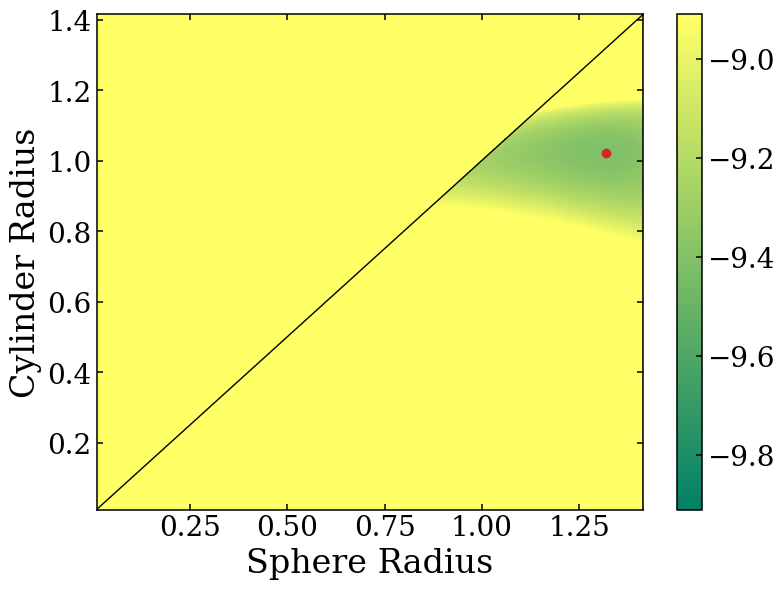

In [3]:
fig, ax = create_fig(1, 1)
ax = ax[0]

im = ax.pcolormesh(rs_mesh, rc_mesh, mu, vmin=mu_min-0.5, vmax=mu_min+0.5, cmap='summer')
ax.scatter(rs_min, rc_min, color='C3')
ax.plot(rs, rs, color='k')
ax.axvline(mic.length, color='k')
ax.set_xlabel('Sphere Radius')
ax.set_ylabel('Cylinder Radius')
plt.colorbar(im)

In [18]:
mic = micelle.RodlikeMicelle(130, 298, 10, throw_errors=False)
mic.optimise_radii([1.2, 1.0])
rs_min = mic.radius_sphere
rc_min = mic.radius_cylinder
mu_min = mic.get_delta_chempot()
index = np.where(mu == np.amin(mu))
print(index)
print(rs[index[1]])
print(rc[index[0]])
print(np.amin(mu))
print(mu_min, mic.radius_sphere, mic.radius_cylinder)
# Should be -9.404 ish


(array([179]), array([231]))
[1.31343373]
[1.02002008]
-9.41031737320152
-9.378681314861714 1.3888731886633787 0.9858090007365418


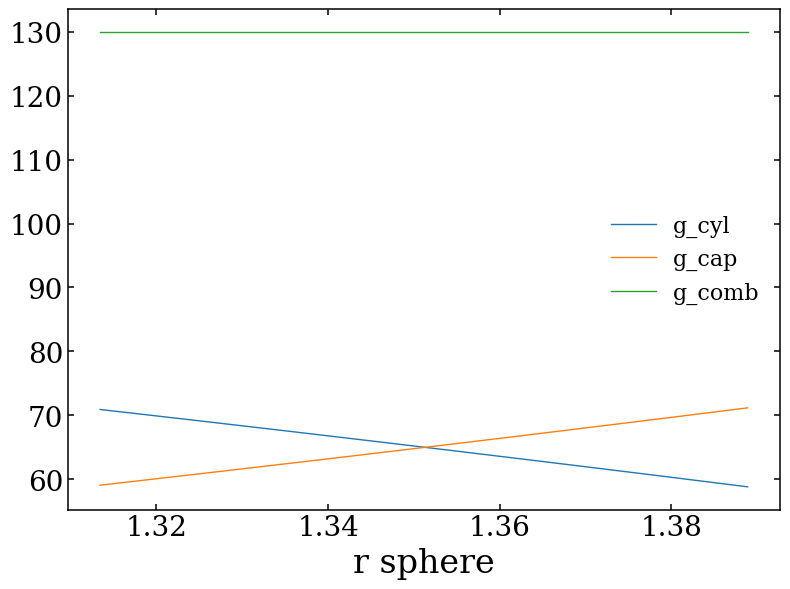

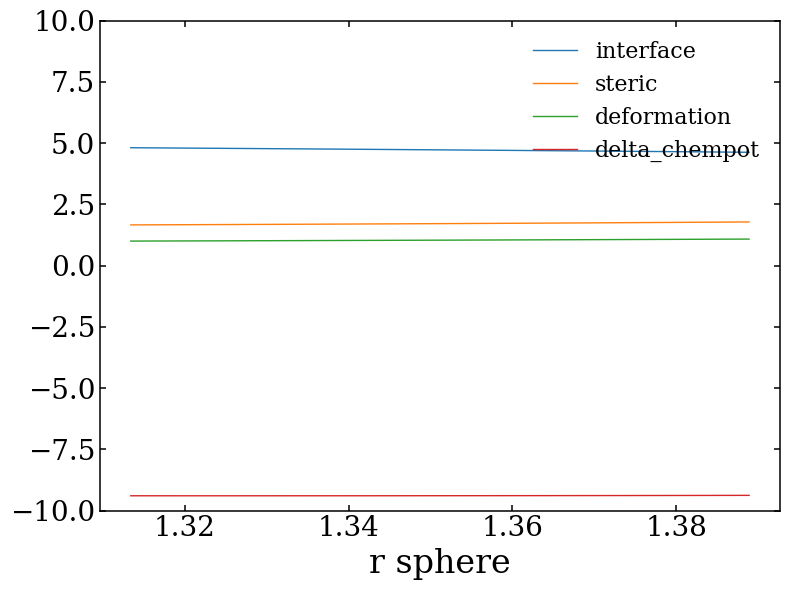

In [19]:
def plot_prop(mic, mic_fun, r_sphere, r_cyl, **kwargs):
    fig, ax = create_fig(1, 1)
    ax = ax[0]
    prop = np.zeros(r_sphere.shape)
    mic._r_cyl = r_cyl
    for mic_fun_i in mic_fun:
        for i, r_sphi in enumerate(r_sphere):
            mic._r_sph = r_sphi
            prop[i] = mic_fun_i(mic)
        ax.plot(r_sphere, prop)
    
    ax.set_ylim(kwargs.pop('ylim', ax.get_ylim()))
    ax.legend(kwargs.pop('labels', []))
    ax.set_xlabel('r sphere')

this_r_cyl = rc_min
these_rs = np.linspace(rs[index[1]], mic.radius_sphere, 100)

plot_prop(mic, [lambda x : x.surfactants_number_cyl, lambda x: x.surfactants_number_cap , lambda x: x.surfactants_number], these_rs, this_r_cyl, 
labels=['g_cyl', 'g_cap', 'g_comb'])

plot_prop(mic, [lambda x : x.get_interface_free_energy(), lambda x: x.get_steric_free_energy(), lambda x: x.get_deformation_free_energy(), lambda x: x.get_delta_chempot()], these_rs, this_r_cyl, 
labels=['interface', 'steric', 'deformation', 'delta_chempot'], ylim=(-10, 10))

# Why do the g graphs meet exactly at the middle? Why is same radius = same volume? 

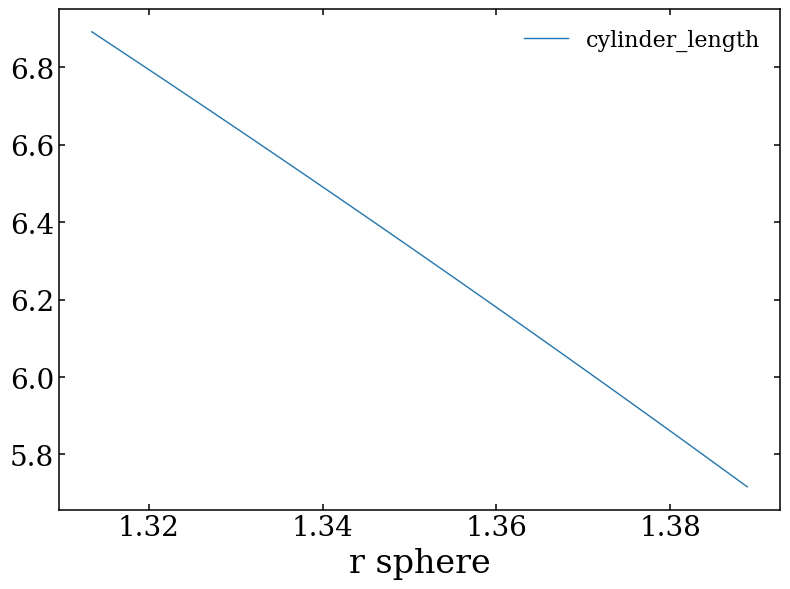

In [20]:
# The higher the radius the higher the lengh -- surprising
plot_prop(mic, [lambda x : x.cylinder_length], these_rs, this_r_cyl, 
labels=['cylinder_length'])

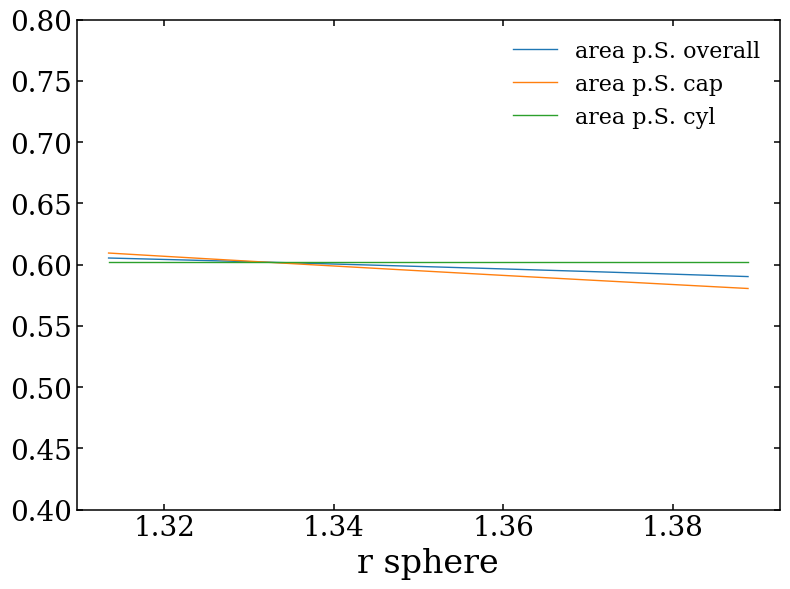

In [21]:
# Overall area is going down with increasing cylinder radius
plot_prop(mic, [lambda x : x.area_per_surfactant, lambda x: x.area_per_surfactant_cap, lambda x: x.area_per_surfactant_cyl], these_rs, this_r_cyl, 
labels=['area p.S. overall', 'area p.S. cap', 'area p.S. cyl'], ylim=(0.4, 0.8))

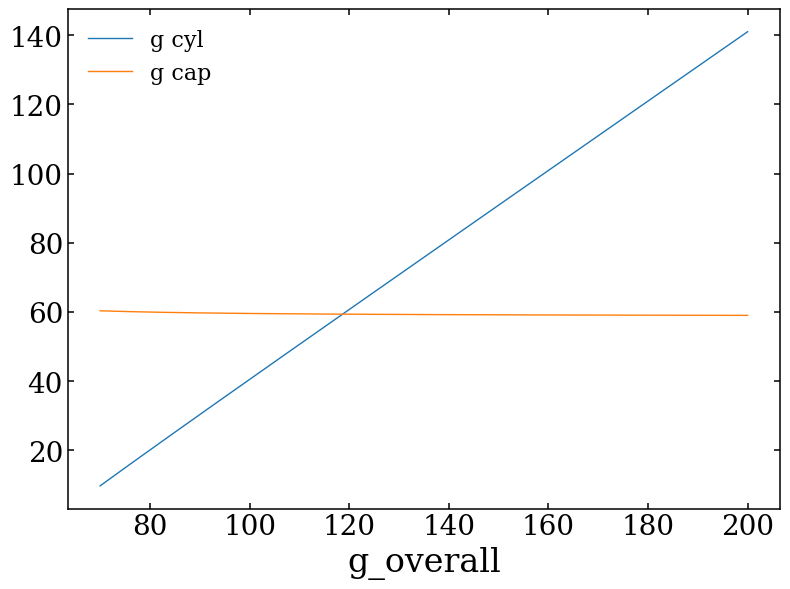

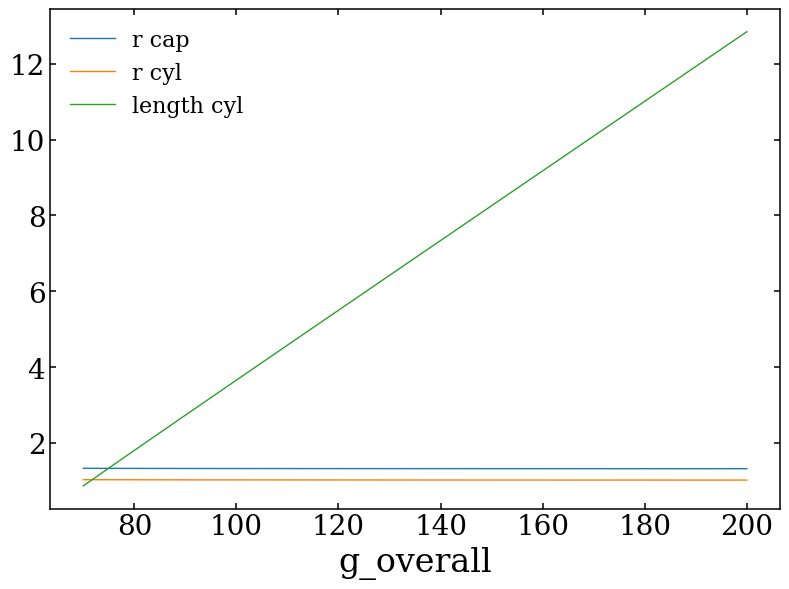

In [22]:
def plot_prop_optim(mic, mic_fun, gs, **kwargs):
    fig, ax = create_fig(1, 1)
    ax = ax[0]
    prop = np.zeros(gs.shape)

    for mic_fun_i in mic_fun:
        for i, gi in enumerate(gs):
            mic._g = gi
            mic.optimise_radii([1.2, 1.0])
            prop[i] = mic_fun_i(mic)
        ax.plot(gs, prop)
    
    ax.set_ylim(kwargs.pop('ylim', ax.get_ylim()))
    ax.legend(kwargs.pop('labels', []))
    ax.set_xlabel('g_overall')

gs = np.linspace(70, 200, 200)

plot_prop_optim(mic, [lambda x : x.surfactants_number_cyl, lambda x: x.surfactants_number_cap], gs, 
labels=['g cyl', 'g cap', 'overall'])

plot_prop_optim(mic, [lambda x : x.radius_sphere, lambda x: x.radius_cylinder, lambda x: x.cylinder_length], gs, 
labels=['r cap', 'r cyl', 'length cyl'])

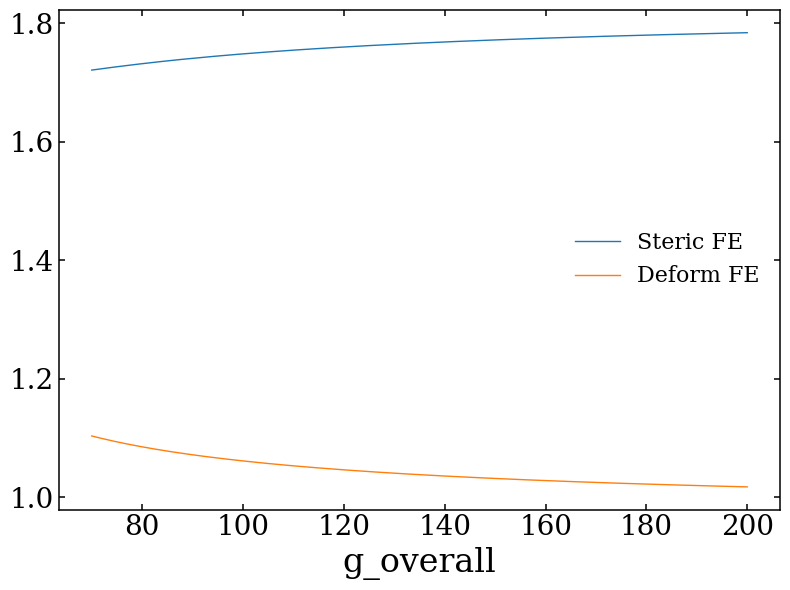

In [23]:
plot_prop_optim(mic, [lambda x: x.get_steric_free_energy(), lambda x: x.get_deformation_free_energy()], gs, 
labels=['Steric FE', 'Deform FE', 'length cyl'])

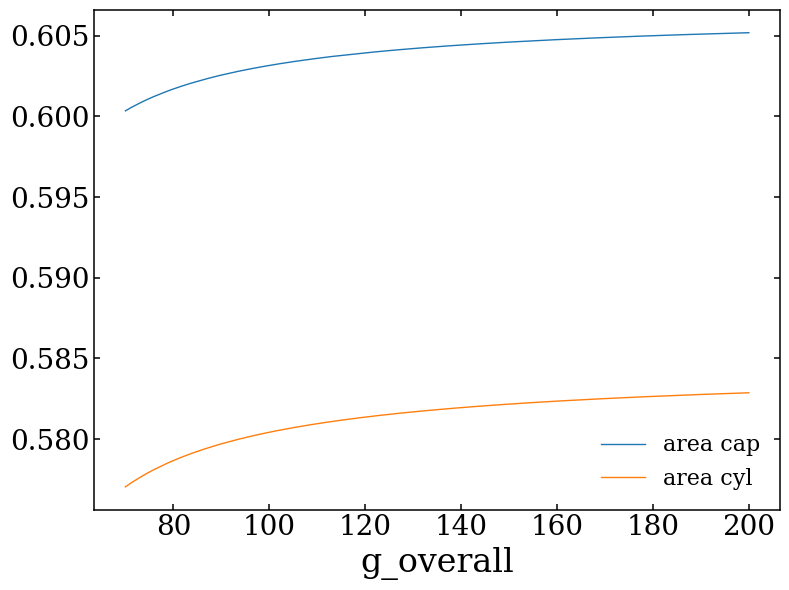

In [24]:
plot_prop_optim(mic, [lambda x: x.area_per_surfactant_cap, lambda x: x.area_per_surfactant_cyl], gs, 
labels=['area cap', 'area cyl'])

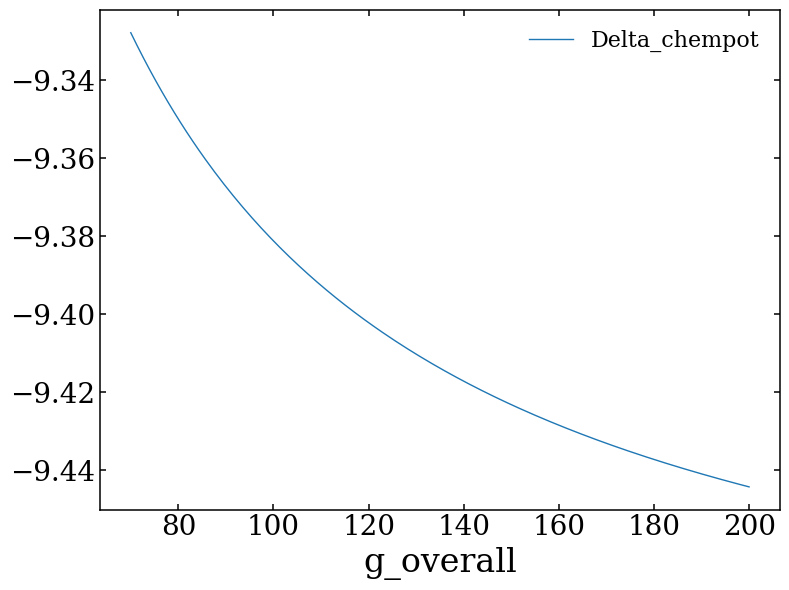

In [25]:
#mic = micelle.RodlikeMicelle(130, 298, 10, throw_errors=False)

plot_prop_optim(mic, [lambda x: x.get_delta_chempot()], gs, 
labels=['Delta_chempot', 'r cyl', 'length cyl'])

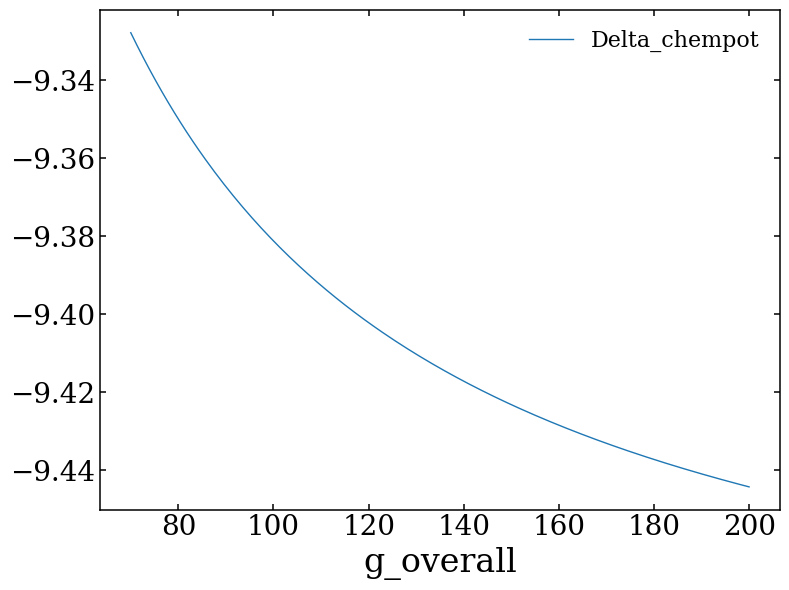

In [26]:
# Compare this behaviour with the previous window... Odd?
mic = micelle.RodlikeMicelle(130, 298, 10, throw_errors=False)

plot_prop_optim(mic, [lambda x: x.get_delta_chempot()], gs, 
labels=['Delta_chempot',])